In [2]:
# 📦 Instale antes, se necessário:
# pip install ultralytics opencv-python matplotlib pandas pyyaml scikit-learn

import os
import yaml
import cv2
import torch
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image
from ultralytics import YOLO
from sklearn.metrics import precision_score, recall_score, f1_score

# 📂 Caminhos do dataset
dataset_yaml = {
    "train": r"C:\\Users\\Jorge Cunha\\Desktop\\Python\\AI_Detection_Cars\\AAU2\\DetectObjects_JC\\dataset\\train\\images",
    "val": r"C:\\Users\\Jorge Cunha\\Desktop\\Python\\AI_Detection_Cars\\AAU2\\DetectObjects_JC\\dataset\\val\\images",
    "test": r"C:\\Users\\Jorge Cunha\\Desktop\\Python\\AI_Detection_Cars\\AAU2\\DetectObjects_JC\\dataset\\test\\images",
    "nc": 9,
    "names": [
        "Trafic Light Signal", "Stop Signal", "Speedlimit Signal", "Crosswalk Signal",
        "Crosswalk", "Pedestrian", "Bus", "Car", "Truck"
    ]
}

# 📝 Salva o dataset.yaml
with open("dataset.yaml", "w") as f:
    yaml.dump(dataset_yaml, f)

# 🚀 Carrega o modelo YOLO pré-treinado
model = YOLO("models/yolo11m.pt")

# 🧠 Treinamento com hiperparâmetros otimizados
results = model.train(
    data="dataset.yaml",
    epochs=100,
    imgsz=640,
    batch=8,
    name="yolo11m_finetuned",
    project="runs_second_yolo",
    workers=2,
    patience=10,
    cos_lr=True,
    warmup_epochs=5,
    close_mosaic=5,
    mixup=0.2,
    copy_paste=0.1,
    auto_augment="randaugment",
    save=True,
    val=True,
    save_json=True,
    device=0 if torch.cuda.is_available() else "cpu"
)

# 📍 Caminho automático para o best.pt gerado
best_model_path = os.path.join(results.save_dir, "weights", "best.pt")

# 🔁 Carrega o melhor modelo treinado
model = YOLO(best_model_path)

# 📊 Avaliação (com limiar mais sensível para recall)
model.val(data="dataset.yaml", split="val", conf=0.25, save_json=True)

# 🖼️ Testar previsões em imagens de validação
val_dir = dataset_yaml["val"]
image_paths = sorted([
    os.path.join(val_dir, f) for f in os.listdir(val_dir)
    if f.lower().endswith((".jpg", ".jpeg", ".png"))
])

# 🔎 Função de visualização
def visualize_prediction(image_path, model, class_names, conf_thresh=0.3):
    image = cv2.imread(image_path)
    result = model(image_path, conf=conf_thresh)[0]

    for box, score, label in zip(result.boxes.xyxy, result.boxes.conf, result.boxes.cls):
        if score < conf_thresh:
            continue
        x1, y1, x2, y2 = map(int, box.tolist())
        class_id = int(label)
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(image, f"{class_names[class_id]} {score:.2f}", (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    plt.figure(figsize=(10, 6))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()

# 🧪 Visualiza 15 imagens
for img_path in image_paths[:15]:
    print(f"🖼️ Imagem: {os.path.basename(img_path)}")
    visualize_prediction(img_path, model, dataset_yaml["names"], conf_thresh=0.3)

# 🧮 Avaliação binária por presença de classe
def evaluate_accuracy(model, image_paths, class_names):
    y_true_all, y_pred_all = [], []

    for img_path in tqdm(image_paths):
        label_file = img_path.replace("images", "labels").rsplit(".", 1)[0] + ".txt"
        if not os.path.exists(label_file):
            continue

        with open(label_file, "r") as f:
            gt_classes = [int(line.split()[0]) for line in f.readlines()]

        result = model(img_path, conf=0.25)[0]
        pred_classes = result.boxes.cls.int().cpu().tolist() if result.boxes.cls is not None else []

        for cls in set(gt_classes + pred_classes):
            y_true_all.append(1 if cls in gt_classes else 0)
            y_pred_all.append(1 if cls in pred_classes else 0)

    precision = precision_score(y_true_all, y_pred_all, average='binary')
    recall = recall_score(y_true_all, y_pred_all, average='binary')
    f1 = f1_score(y_true_all, y_pred_all, average='binary')

    print(f"\n📊 Avaliação Binária (por classe presente/ausente):")
    print(f"✅ Precisão: {precision:.2f}")
    print(f"✅ Revocação: {recall:.2f}")
    print(f"✅ F1-Score: {f1:.2f}")

# 📏 Avaliação final
evaluate_accuracy(model, image_paths, dataset_yaml["names"])


Ultralytics 8.3.98  Python-3.12.9 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
engine\trainer: task=detect, mode=train, model=yolo11m.pt, data=dataset.yaml, epochs=100, time=None, patience=10, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=2, project=runs, name=yolo11m_finetuned2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=5, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=True, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_con

train: Scanning C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\train\labels.cache... 1263 images, 5 backgrounds, 0 corrupt: 100%|██████████| 1263/1263 [00:00<?, ?it/s]
val: Scanning C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\labels.cache... 158 images, 0 backgrounds, 0 corrupt: 100%|██████████| 158/158 [00:00<?, ?it/s]


Plotting labels to runs\yolo11m_finetuned2\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000769, momentum=0.9) with parameter groups 106 weight(decay=0.0), 113 weight(decay=0.0005), 112 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs\yolo11m_finetuned2
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      4.31G      1.368      1.647      1.212         52        640: 100%|██████████| 158/158 [02:33<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.32it/s]

                   all        158        794      0.673      0.621      0.649      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100       4.3G      1.413      1.185       1.23        131        640: 100%|██████████| 158/158 [02:39<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.26it/s]

                   all        158        794      0.718      0.568       0.65      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      4.32G       1.42      1.174      1.251         63        640: 100%|██████████| 158/158 [02:54<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.20it/s]

                   all        158        794      0.568      0.636      0.654       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      4.33G      1.419      1.153      1.253         61        640: 100%|██████████| 158/158 [02:50<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.26it/s]

                   all        158        794      0.688      0.575      0.637       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      4.35G      1.441      1.154      1.255         97        640: 100%|██████████| 158/158 [03:01<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.25it/s]

                   all        158        794      0.549       0.66       0.63      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      4.31G      1.455      1.147      1.271         18        640: 100%|██████████| 158/158 [02:32<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.28it/s]

                   all        158        794      0.593      0.633       0.64      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      4.33G      1.402      1.129      1.258         29        640: 100%|██████████| 158/158 [02:07<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.17it/s]

                   all        158        794      0.626      0.741      0.701      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      4.35G      1.395       1.05      1.238         58        640: 100%|██████████| 158/158 [02:29<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.19it/s]

                   all        158        794      0.721      0.678      0.718      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      4.32G      1.419      1.066      1.246         79        640: 100%|██████████| 158/158 [03:12<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.33it/s]

                   all        158        794      0.847      0.721      0.772      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      4.34G      1.394      1.055      1.244         26        640: 100%|██████████| 158/158 [02:52<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:10<00:00,  1.01s/it]

                   all        158        794      0.763      0.731      0.733      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      4.33G      1.377     0.9797      1.236         76        640: 100%|██████████| 158/158 [03:10<00:00,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.13it/s]

                   all        158        794      0.846      0.704      0.784      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100       4.3G      1.352     0.9674      1.212         74        640: 100%|██████████| 158/158 [02:51<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:12<00:00,  1.25s/it]

                   all        158        794      0.785      0.749      0.803      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      4.31G      1.357     0.9556      1.222         33        640: 100%|██████████| 158/158 [03:24<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.42it/s]

                   all        158        794       0.81      0.746      0.786      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      4.31G      1.354     0.9618      1.226         86        640: 100%|██████████| 158/158 [02:47<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:10<00:00,  1.01s/it]

                   all        158        794      0.835      0.726      0.809       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      4.31G      1.341     0.9436        1.2         81        640: 100%|██████████| 158/158 [02:45<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.22it/s]

                   all        158        794      0.754      0.752      0.769      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      4.38G       1.32     0.9022      1.198         89        640: 100%|██████████| 158/158 [03:14<00:00,  1.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.21it/s]

                   all        158        794      0.796      0.765      0.794       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      4.32G        1.3     0.8985      1.187         55        640: 100%|██████████| 158/158 [03:59<00:00,  1.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:09<00:00,  1.08it/s]

                   all        158        794       0.75      0.753      0.777      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      4.34G      1.295     0.8852      1.182         75        640: 100%|██████████| 158/158 [02:40<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.24it/s]

                   all        158        794      0.835      0.807      0.844      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100       4.3G      1.299     0.8829      1.182         30        640: 100%|██████████| 158/158 [02:23<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.12it/s]

                   all        158        794       0.81      0.769      0.831      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      4.31G      1.299     0.8463      1.177         34        640: 100%|██████████| 158/158 [02:32<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:09<00:00,  1.05it/s]

                   all        158        794      0.746      0.777      0.812      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      4.32G      1.307     0.8557      1.182         83        640: 100%|██████████| 158/158 [02:27<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.21it/s]

                   all        158        794      0.806      0.774      0.838      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      4.29G      1.276     0.8673      1.175         21        640: 100%|██████████| 158/158 [02:23<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:11<00:00,  1.13s/it]

                   all        158        794      0.853      0.787      0.813      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      4.31G      1.294     0.8515      1.179         44        640: 100%|██████████| 158/158 [02:05<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.18it/s]

                   all        158        794      0.775      0.754      0.765      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      4.31G      1.267     0.8316      1.174         80        640: 100%|██████████| 158/158 [03:04<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:12<00:00,  1.23s/it]

                   all        158        794      0.823       0.76      0.823      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      4.35G      1.256     0.8325      1.164        114        640: 100%|██████████| 158/158 [02:22<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:10<00:00,  1.05s/it]

                   all        158        794      0.762      0.784      0.807      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      4.33G      1.244     0.8126      1.165        137        640: 100%|██████████| 158/158 [02:51<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.29it/s]

                   all        158        794      0.822      0.746      0.801      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      4.31G      1.251     0.7889      1.165         87        640: 100%|██████████| 158/158 [02:18<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.15it/s]

                   all        158        794      0.832      0.774      0.849      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      4.29G      1.261     0.8056      1.164         67        640: 100%|██████████| 158/158 [03:03<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:09<00:00,  1.11it/s]

                   all        158        794       0.75      0.824      0.827      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      4.32G       1.24     0.7917      1.159        116        640: 100%|██████████| 158/158 [02:40<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.12it/s]

                   all        158        794      0.846      0.815      0.851      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      4.31G      1.211     0.7834      1.147        143        640: 100%|██████████| 158/158 [02:32<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:09<00:00,  1.05it/s]

                   all        158        794      0.792      0.815      0.828        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      4.32G      1.264     0.7816      1.165         44        640: 100%|██████████| 158/158 [03:05<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.17it/s]

                   all        158        794      0.836       0.78      0.846      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      4.33G      1.241     0.7923      1.152         84        640: 100%|██████████| 158/158 [02:34<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:09<00:00,  1.08it/s]

                   all        158        794      0.849      0.812      0.846      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      4.32G      1.211     0.7659       1.15        112        640: 100%|██████████| 158/158 [03:43<00:00,  1.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.45it/s]

                   all        158        794      0.862      0.786      0.845      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      4.31G      1.195     0.7499      1.133         38        640: 100%|██████████| 158/158 [03:18<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:11<00:00,  1.17s/it]

                   all        158        794      0.776      0.836      0.834       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      4.34G      1.219     0.7462      1.143         48        640: 100%|██████████| 158/158 [02:38<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:09<00:00,  1.11it/s]

                   all        158        794      0.785      0.838      0.841      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100       4.3G      1.204     0.7844      1.135         98        640: 100%|██████████| 158/158 [02:54<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.19it/s]

                   all        158        794      0.837      0.809       0.84      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      4.32G       1.18     0.7427      1.131         81        640: 100%|██████████| 158/158 [02:54<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.26it/s]

                   all        158        794      0.816      0.796       0.82      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      4.32G      1.192     0.7531      1.132        125        640: 100%|██████████| 158/158 [02:39<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:09<00:00,  1.04it/s]

                   all        158        794      0.829      0.819      0.841      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      4.34G       1.19     0.7391       1.13         72        640: 100%|██████████| 158/158 [02:22<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.36it/s]

                   all        158        794      0.854      0.842      0.871      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      4.31G       1.18     0.7276       1.13        154        640: 100%|██████████| 158/158 [02:52<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.21it/s]

                   all        158        794      0.827      0.854      0.879       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      4.32G       1.18     0.7192      1.127         92        640: 100%|██████████| 158/158 [02:47<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:09<00:00,  1.10it/s]

                   all        158        794      0.879      0.784      0.861      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      4.32G        1.2     0.7155      1.132        102        640: 100%|██████████| 158/158 [03:05<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.19it/s]

                   all        158        794      0.889      0.793      0.861      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      4.33G       1.15     0.7066      1.117         74        640: 100%|██████████| 158/158 [02:41<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.51it/s]

                   all        158        794      0.871      0.843      0.872      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      4.29G      1.166     0.7198      1.124        116        640: 100%|██████████| 158/158 [02:41<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.35it/s]

                   all        158        794      0.815      0.844      0.859      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      4.31G      1.155     0.7099      1.114        153        640: 100%|██████████| 158/158 [03:21<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.44it/s]

                   all        158        794      0.854      0.812       0.87      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      4.31G      1.159      0.698      1.118        119        640: 100%|██████████| 158/158 [03:53<00:00,  1.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:12<00:00,  1.21s/it]

                   all        158        794      0.839      0.843      0.871      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      4.32G      1.151     0.6827      1.108         94        640: 100%|██████████| 158/158 [02:27<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.22it/s]

                   all        158        794      0.861      0.825       0.87      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      4.31G       1.16     0.6971      1.116         77        640: 100%|██████████| 158/158 [02:38<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:11<00:00,  1.17s/it]

                   all        158        794      0.797      0.841      0.861       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      4.29G      1.167     0.6729      1.119         92        640: 100%|██████████| 158/158 [02:54<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:10<00:00,  1.03s/it]

                   all        158        794      0.833      0.804      0.861      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      4.33G      1.126     0.6804      1.104        101        640: 100%|██████████| 158/158 [02:33<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.16it/s]

                   all        158        794      0.874      0.801      0.883      0.659
EarlyStopping: Training stopped early as no improvement observed in last 10 epochs. Best results observed at epoch 40, best model saved as best.pt.
To update EarlyStopping(patience=10) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



50 epochs completed in 2.488 hours.
Optimizer stripped from runs\yolo11m_finetuned2\weights\last.pt, 40.5MB
Optimizer stripped from runs\yolo11m_finetuned2\weights\best.pt, 40.5MB

Validating runs\yolo11m_finetuned2\weights\best.pt...
Ultralytics 8.3.98  Python-3.12.9 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
YOLO11m summary (fused): 125 layers, 20,036,971 parameters, 0 gradients, 67.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.64it/s]


                   all        158        794      0.827      0.854      0.879      0.661
   Trafic Light Signal          8         16      0.672       0.75      0.767      0.556
           Stop Signal          8          8      0.729          1      0.995      0.936
     Speedlimit Signal         67         71      0.988          1      0.995      0.907
      Crosswalk Signal         17         21      0.898      0.905      0.903      0.741
             Crosswalk         17         18      0.794      0.944      0.919      0.626
            Pedestrian         10         29      0.791      0.785      0.798      0.525
                   Bus          8          9      0.868      0.737      0.816      0.626
                   Car         45        407      0.885       0.72       0.85      0.493
                 Truck         43        215      0.817      0.842      0.871      0.542
Speed: 0.5ms preprocess, 32.0ms inference, 0.0ms loss, 0.9ms postprocess per image
Saving runs\yolo11m_finetun

val: Scanning C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\labels.cache... 158 images, 0 backgrounds, 0 corrupt: 100%|██████████| 158/158 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:12<00:00,  1.22s/it]


                   all        158        794      0.819      0.849      0.882      0.693
   Trafic Light Signal          8         16      0.667       0.75      0.832      0.624
           Stop Signal          8          8      0.727          1      0.995      0.942
     Speedlimit Signal         67         71          1          1      0.995      0.919
      Crosswalk Signal         17         21      0.905      0.905       0.92      0.788
             Crosswalk         17         18       0.78      0.944      0.914      0.657
            Pedestrian         10         29      0.742      0.793      0.806      0.568
                   Bus          8          9      0.857      0.667      0.794      0.623
                   Car         45        407      0.884       0.74      0.824      0.536
                 Truck         43        215      0.808      0.842      0.856      0.577
Speed: 0.9ms preprocess, 71.8ms inference, 0.0ms loss, 0.7ms postprocess per image
Saving runs\detect\val\pred

<Figure size 1000x600 with 1 Axes>

🖼️ Imagem: i1045.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1045.jpg: 640x640 3 Crosswalks, 22.6ms
Speed: 2.6ms preprocess, 22.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


<Figure size 1000x600 with 1 Axes>

🖼️ Imagem: i1051.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1051.jpg: 640x640 1 Crosswalk Signal, 1 Crosswalk, 22.7ms
Speed: 2.9ms preprocess, 22.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


<Figure size 1000x600 with 1 Axes>

🖼️ Imagem: i1055.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1055.jpg: 640x640 1 Crosswalk, 22.8ms
Speed: 3.1ms preprocess, 22.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


<Figure size 1000x600 with 1 Axes>

🖼️ Imagem: i1069.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1069.jpg: 640x640 3 Crosswalks, 1 Pedestrian, 22.7ms
Speed: 2.8ms preprocess, 22.7ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


<Figure size 1000x600 with 1 Axes>

🖼️ Imagem: i1270.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1270.jpg: 384x640 4 Pedestrians, 58.8ms
Speed: 1.1ms preprocess, 58.8ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


<Figure size 1000x600 with 1 Axes>

🖼️ Imagem: i1271.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1271.jpg: 448x640 1 Pedestrian, 56.1ms
Speed: 1.8ms preprocess, 56.1ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)


<Figure size 1000x600 with 1 Axes>

🖼️ Imagem: i1272.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1272.jpg: 288x640 2 Pedestrians, 1 Bus, 52.9ms
Speed: 1.1ms preprocess, 52.9ms inference, 1.4ms postprocess per image at shape (1, 3, 288, 640)


<Figure size 1000x600 with 1 Axes>

🖼️ Imagem: i1273.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1273.jpg: 480x640 6 Pedestrians, 59.7ms
Speed: 1.6ms preprocess, 59.7ms inference, 2.9ms postprocess per image at shape (1, 3, 480, 640)


<Figure size 1000x600 with 1 Axes>

🖼️ Imagem: i1274.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1274.jpg: 448x640 1 Trafic Light Signal, 6 Pedestrians, 17.0ms
Speed: 1.7ms preprocess, 17.0ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)


<Figure size 1000x600 with 1 Axes>

🖼️ Imagem: i1275.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1275.jpg: 640x640 1 Stop Signal, 1 Pedestrian, 23.4ms
Speed: 3.4ms preprocess, 23.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


<Figure size 1000x600 with 1 Axes>

🖼️ Imagem: i1276.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1276.jpg: 480x640 4 Pedestrians, 18.4ms
Speed: 1.6ms preprocess, 18.4ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)


<Figure size 1000x600 with 1 Axes>

🖼️ Imagem: i1277.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1277.jpg: 512x640 2 Pedestrians, 63.5ms
Speed: 1.9ms preprocess, 63.5ms inference, 2.4ms postprocess per image at shape (1, 3, 512, 640)


<Figure size 1000x600 with 1 Axes>

🖼️ Imagem: i1278.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1278.jpg: 448x640 4 Pedestrians, 18.8ms
Speed: 2.2ms preprocess, 18.8ms inference, 2.4ms postprocess per image at shape (1, 3, 448, 640)


<Figure size 1000x600 with 1 Axes>

🖼️ Imagem: i1279.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1279.jpg: 640x640 2 Pedestrians, 23.4ms
Speed: 2.6ms preprocess, 23.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


<Figure size 1000x600 with 1 Axes>

  0%|          | 0/158 [00:00<?, ?it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1041.jpg: 640x640 1 Crosswalk, 22.6ms
Speed: 2.6ms preprocess, 22.6ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1045.jpg: 640x640 3 Crosswalks, 22.8ms
Speed: 2.9ms preprocess, 22.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1051.jpg: 640x640 1 Crosswalk Signal, 1 Crosswalk, 24.0ms
Speed: 2.6ms preprocess, 24.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


  2%|▏         | 3/158 [00:00<00:05, 26.09it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1055.jpg: 640x640 1 Crosswalk, 22.7ms
Speed: 2.6ms preprocess, 22.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1069.jpg: 640x640 4 Crosswalks, 1 Pedestrian, 22.8ms
Speed: 2.7ms preprocess, 22.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1270.jpg: 384x640 4 Pedestrians, 16.0ms
Speed: 1.4ms preprocess, 16.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


  4%|▍         | 6/158 [00:00<00:05, 27.50it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1271.jpg: 448x640 1 Pedestrian, 17.0ms
Speed: 1.8ms preprocess, 17.0ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1272.jpg: 288x640 2 Pedestrians, 1 Bus, 16.2ms
Speed: 1.4ms preprocess, 16.2ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1273.jpg: 480x640 6 Pedestrians, 17.9ms
Speed: 1.7ms preprocess, 17.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1274.jpg: 448x640 1 Trafic Light Signal, 6 Pedestrians, 20.2ms
Speed: 1.6ms preprocess, 20.2ms inference, 2.8ms postprocess per image at shape (1, 3, 448, 

  6%|▋         | 10/158 [00:00<00:05, 28.91it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1275.jpg: 640x640 1 Stop Signal, 1 Pedestrian, 23.3ms
Speed: 3.6ms preprocess, 23.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1276.jpg: 480x640 5 Pedestrians, 18.9ms
Speed: 1.3ms preprocess, 18.9ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1277.jpg: 512x640 3 Pedestrians, 18.6ms
Speed: 2.5ms preprocess, 18.6ms inference, 1.2ms postprocess per image at shape (1, 3, 512, 640)


  8%|▊         | 13/158 [00:00<00:05, 27.82it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1278.jpg: 448x640 4 Pedestrians, 17.2ms
Speed: 2.2ms preprocess, 17.2ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1279.jpg: 640x640 2 Pedestrians, 24.1ms
Speed: 2.7ms preprocess, 24.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1322.jpg: 480x640 1 Bus, 9 Cars, 4 Trucks, 18.7ms
Speed: 0.9ms preprocess, 18.7ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


 10%|█         | 16/158 [00:00<00:05, 26.23it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1323.jpg: 480x640 8 Cars, 2 Trucks, 17.4ms
Speed: 1.1ms preprocess, 17.4ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1326.jpg: 480x640 1 Bus, 6 Cars, 5 Trucks, 17.1ms
Speed: 1.0ms preprocess, 17.1ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1327.jpg: 480x640 7 Cars, 4 Trucks, 17.6ms
Speed: 1.1ms preprocess, 17.6ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1332.jpg: 480x640 5 Cars, 2 Trucks, 17.1ms
Speed: 1.1ms preprocess, 17.1ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


 13%|█▎        | 20/158 [00:00<00:04, 28.31it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1333.jpg: 480x640 10 Cars, 5 Trucks, 17.2ms
Speed: 1.0ms preprocess, 17.2ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1336.jpg: 480x640 4 Cars, 3 Trucks, 17.5ms
Speed: 1.1ms preprocess, 17.5ms inference, 2.5ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1337.jpg: 480x640 11 Cars, 14 Trucks, 17.9ms
Speed: 1.0ms preprocess, 17.9ms inference, 2.3ms postprocess per image at shape (1, 3, 480, 640)


 15%|█▍        | 23/158 [00:00<00:04, 27.92it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1440.jpg: 480x640 12 Cars, 2 Trucks, 17.2ms
Speed: 1.0ms preprocess, 17.2ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1441.jpg: 480x640 8 Cars, 7 Trucks, 18.1ms
Speed: 1.1ms preprocess, 18.1ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1444.jpg: 480x640 10 Cars, 6 Trucks, 17.5ms
Speed: 1.0ms preprocess, 17.5ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)


 16%|█▋        | 26/158 [00:00<00:04, 28.51it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1445.jpg: 480x640 5 Cars, 7 Trucks, 17.1ms
Speed: 1.0ms preprocess, 17.1ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1451.jpg: 480x640 1 Bus, 6 Cars, 5 Trucks, 17.2ms
Speed: 0.9ms preprocess, 17.2ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1454.jpg: 480x640 5 Cars, 8 Trucks, 17.8ms
Speed: 1.2ms preprocess, 17.8ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1455.jpg: 480x640 4 Cars, 5 Trucks, 17.1ms
Speed: 1.1ms preprocess, 17.1ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


 19%|█▉        | 30/158 [00:01<00:04, 29.68it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1468.jpg: 480x640 8 Cars, 3 Trucks, 17.7ms
Speed: 1.1ms preprocess, 17.7ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1469.jpg: 480x640 9 Cars, 6 Trucks, 18.5ms
Speed: 1.1ms preprocess, 18.5ms inference, 2.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1479.jpg: 480x640 11 Cars, 7 Trucks, 18.2ms
Speed: 1.1ms preprocess, 18.2ms inference, 2.3ms postprocess per image at shape (1, 3, 480, 640)


 21%|██        | 33/158 [00:01<00:04, 29.36it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1482.jpg: 480x640 10 Cars, 6 Trucks, 17.5ms
Speed: 1.0ms preprocess, 17.5ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1483.jpg: 480x640 6 Cars, 2 Trucks, 17.3ms
Speed: 1.0ms preprocess, 17.3ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1486.jpg: 480x640 11 Cars, 5 Trucks, 17.3ms
Speed: 1.0ms preprocess, 17.3ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1492.jpg: 480x640 1 Bus, 11 Cars, 14 Trucks, 17.6ms
Speed: 1.0ms preprocess, 17.6ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)


 23%|██▎       | 37/158 [00:01<00:04, 29.61it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1496.jpg: 480x640 8 Cars, 9 Trucks, 17.2ms
Speed: 0.9ms preprocess, 17.2ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1497.jpg: 480x640 10 Cars, 4 Trucks, 17.1ms
Speed: 1.1ms preprocess, 17.1ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1509.jpg: 480x640 9 Cars, 6 Trucks, 18.2ms
Speed: 1.0ms preprocess, 18.2ms inference, 2.5ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1519.jpg: 480x640 11 Cars, 6 Trucks, 17.1ms
Speed: 1.0ms preprocess, 17.1ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


 26%|██▌       | 41/158 [00:01<00:03, 30.13it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1521.jpg: 480x640 11 Cars, 5 Trucks, 17.4ms
Speed: 1.0ms preprocess, 17.4ms inference, 2.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1525.jpg: 480x640 11 Cars, 3 Trucks, 17.2ms
Speed: 1.0ms preprocess, 17.2ms inference, 2.5ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1531.jpg: 480x640 6 Cars, 17.1ms
Speed: 1.0ms preprocess, 17.1ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1535.jpg: 480x640 8 Cars, 6 Trucks, 17.9ms
Speed: 1.0ms preprocess, 17.9ms inference, 2.3ms postprocess per image at shape (1, 3, 480, 640)


 28%|██▊       | 45/158 [00:01<00:03, 30.33it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i158.png: 640x480 1 Crosswalk Signal, 54.0ms
Speed: 1.4ms preprocess, 54.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i163.png: 640x480 1 Stop Signal, 1 Speedlimit Signal, 16.9ms
Speed: 1.5ms preprocess, 16.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1642.jpg: 480x640 4 Cars, 2 Trucks, 18.8ms
Speed: 1.1ms preprocess, 18.8ms inference, 2.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1643.jpg: 480x640 1 Bus, 8 Cars, 7 Trucks, 17.1ms
Speed: 0.9ms preprocess, 17.1ms inference, 1.3ms postprocess per image at shape (1, 

 31%|███       | 49/158 [00:01<00:03, 27.80it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1647.jpg: 480x640 8 Cars, 5 Trucks, 17.2ms
Speed: 0.9ms preprocess, 17.2ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1653.jpg: 480x640 1 Bus, 5 Cars, 4 Trucks, 17.7ms
Speed: 1.1ms preprocess, 17.7ms inference, 2.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1656.jpg: 480x640 3 Cars, 2 Trucks, 17.2ms
Speed: 1.1ms preprocess, 17.2ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1657.jpg: 480x640 5 Cars, 17.6ms
Speed: 1.0ms preprocess, 17.6ms inference, 2.3ms postprocess per image at shape (1, 3, 480, 640)


 34%|███▎      | 53/158 [00:01<00:03, 28.66it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i166.png: 640x480 1 Crosswalk Signal, 18.8ms
Speed: 1.4ms preprocess, 18.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1680.jpg: 480x640 1 Bus, 10 Cars, 10 Trucks, 17.8ms
Speed: 1.0ms preprocess, 17.8ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1681.jpg: 480x640 9 Cars, 4 Trucks, 17.1ms
Speed: 1.3ms preprocess, 17.1ms inference, 2.3ms postprocess per image at shape (1, 3, 480, 640)


 35%|███▌      | 56/158 [00:01<00:03, 28.91it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1684.jpg: 480x640 11 Cars, 7 Trucks, 17.8ms
Speed: 1.0ms preprocess, 17.8ms inference, 2.2ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1690.jpg: 480x640 6 Cars, 7 Trucks, 17.2ms
Speed: 1.0ms preprocess, 17.2ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1694.jpg: 480x640 6 Cars, 6 Trucks, 17.6ms
Speed: 1.1ms preprocess, 17.6ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)


 37%|███▋      | 59/158 [00:02<00:03, 28.75it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i170.png: 640x480 2 Trafic Light Signals, 1 Crosswalk Signal, 1 Pedestrian, 18.5ms
Speed: 1.5ms preprocess, 18.5ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i172.png: 640x480 1 Speedlimit Signal, 17.3ms
Speed: 1.4ms preprocess, 17.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1723.jpg: 480x640 5 Cars, 7 Trucks, 18.7ms
Speed: 1.2ms preprocess, 18.7ms inference, 2.2ms postprocess per image at shape (1, 3, 480, 640)


 39%|███▉      | 62/158 [00:02<00:03, 28.55it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1727.jpg: 480x640 10 Cars, 5 Trucks, 17.3ms
Speed: 1.1ms preprocess, 17.3ms inference, 2.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i173.png: 640x480 1 Speedlimit Signal, 18.4ms
Speed: 1.5ms preprocess, 18.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1733.jpg: 480x640 13 Cars, 6 Trucks, 18.3ms
Speed: 0.9ms preprocess, 18.3ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)


 41%|████      | 65/158 [00:02<00:03, 28.87it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1737.jpg: 480x640 6 Cars, 6 Trucks, 17.2ms
Speed: 1.1ms preprocess, 17.2ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i177.png: 640x480 2 Speedlimit Signals, 17.6ms
Speed: 1.7ms preprocess, 17.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i188.png: 640x480 1 Speedlimit Signal, 17.5ms
Speed: 1.5ms preprocess, 17.5ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)


 43%|████▎     | 68/158 [00:02<00:03, 29.10it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i198.png: 640x480 1 Speedlimit Signal, 16.9ms
Speed: 1.6ms preprocess, 16.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i199.png: 640x480 1 Speedlimit Signal, 16.9ms
Speed: 1.6ms preprocess, 16.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i2.png: 640x512 2 Trafic Light Signals, 51.1ms
Speed: 1.7ms preprocess, 51.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 512)


 45%|████▍     | 71/158 [00:02<00:03, 26.30it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i204.png: 640x480 1 Crosswalk Signal, 18.4ms
Speed: 1.5ms preprocess, 18.4ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i205.png: 640x480 1 Crosswalk Signal, 17.1ms
Speed: 1.5ms preprocess, 17.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i206.png: 640x480 1 Speedlimit Signal, 17.1ms
Speed: 1.4ms preprocess, 17.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 47%|████▋     | 74/158 [00:02<00:03, 27.14it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i207.png: 640x480 1 Speedlimit Signal, 2 Crosswalk Signals, 17.4ms
Speed: 1.4ms preprocess, 17.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i210.png: 640x480 1 Speedlimit Signal, 17.1ms
Speed: 1.5ms preprocess, 17.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i211.png: 640x480 1 Speedlimit Signal, 17.2ms
Speed: 1.4ms preprocess, 17.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 480)


 49%|████▊     | 77/158 [00:02<00:02, 27.85it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i212.png: 640x480 1 Speedlimit Signal, 17.3ms
Speed: 1.4ms preprocess, 17.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i238.png: 640x480 2 Speedlimit Signals, 16.9ms
Speed: 1.3ms preprocess, 16.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i239.png: 640x480 1 Speedlimit Signal, 16.9ms
Speed: 1.2ms preprocess, 16.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i358.png: 640x480 1 Speedlimit Signal, 1 Crosswalk Signal, 17.3ms
Speed: 1.3ms preprocess, 17.3ms inference, 2.5ms postprocess per image at shape 

 51%|█████▏    | 81/158 [00:02<00:02, 28.76it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i359.png: 640x480 1 Speedlimit Signal, 17.1ms
Speed: 1.4ms preprocess, 17.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i364.png: 640x480 1 Speedlimit Signal, 17.2ms
Speed: 1.4ms preprocess, 17.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i365.png: 640x480 1 Speedlimit Signal, 1 Crosswalk Signal, 17.5ms
Speed: 1.4ms preprocess, 17.5ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)


 53%|█████▎    | 84/158 [00:02<00:02, 29.01it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i366.png: 640x480 1 Speedlimit Signal, 16.8ms
Speed: 1.5ms preprocess, 16.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i370.png: 640x480 1 Speedlimit Signal, 17.0ms
Speed: 1.6ms preprocess, 17.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i371.png: 640x480 1 Speedlimit Signal, 17.2ms
Speed: 1.4ms preprocess, 17.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i372.png: 640x480 1 Speedlimit Signal, 17.2ms
Speed: 1.6ms preprocess, 17.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)


 56%|█████▌    | 88/158 [00:03<00:02, 29.45it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i399.png: 640x480 1 Speedlimit Signal, 17.4ms
Speed: 1.5ms preprocess, 17.4ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i400.png: 640x480 1 Speedlimit Signal, 17.4ms
Speed: 1.6ms preprocess, 17.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i402.png: 640x480 1 Speedlimit Signal, 17.1ms
Speed: 1.3ms preprocess, 17.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i403.png: 640x480 1 Speedlimit Signal, 17.5ms
Speed: 1.6ms preprocess, 17.5ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 480)


 58%|█████▊    | 92/158 [00:03<00:02, 29.65it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i41.png: 640x448 5 Trafic Light Signals, 61.4ms
Speed: 1.3ms preprocess, 61.4ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 448)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i413.png: 640x480 1 Speedlimit Signal, 18.4ms
Speed: 1.5ms preprocess, 18.4ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i414.png: 640x480 1 Speedlimit Signal, 16.9ms
Speed: 1.6ms preprocess, 16.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 60%|██████    | 95/158 [00:03<00:02, 26.39it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i416.png: 640x480 1 Speedlimit Signal, 17.0ms
Speed: 1.6ms preprocess, 17.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i417.png: 640x480 1 Speedlimit Signal, 17.5ms
Speed: 1.7ms preprocess, 17.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i428.png: 640x480 1 Speedlimit Signal, 17.0ms
Speed: 1.4ms preprocess, 17.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 480)


 62%|██████▏   | 98/158 [00:03<00:02, 27.15it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i45.png: 640x448 3 Trafic Light Signals, 18.4ms
Speed: 1.5ms preprocess, 18.4ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 448)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i51.png: 640x640 2 Trafic Light Signals, 24.3ms
Speed: 2.5ms preprocess, 24.3ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i54.png: 640x480 1 Stop Signal, 18.6ms
Speed: 1.5ms preprocess, 18.6ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 480)


 64%|██████▍   | 101/158 [00:03<00:02, 25.68it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i55.png: 448x640 1 Stop Signal, 18.6ms
Speed: 2.2ms preprocess, 18.6ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i561.png: 640x480 1 Speedlimit Signal, 1 Crosswalk Signal, 18.6ms
Speed: 1.9ms preprocess, 18.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i562.png: 640x480 1 Speedlimit Signal, 1 Crosswalk Signal, 17.1ms
Speed: 1.5ms preprocess, 17.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)


 66%|██████▌   | 104/158 [00:03<00:02, 26.12it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i563.png: 640x480 1 Speedlimit Signal, 1 Crosswalk Signal, 16.9ms
Speed: 1.4ms preprocess, 16.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i574.png: 640x480 1 Speedlimit Signal, 1 Crosswalk Signal, 17.0ms
Speed: 1.5ms preprocess, 17.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i576.png: 640x480 1 Speedlimit Signal, 1 Crosswalk Signal, 17.2ms
Speed: 1.5ms preprocess, 17.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)


 68%|██████▊   | 107/158 [00:03<00:01, 27.07it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i577.png: 640x480 1 Speedlimit Signal, 1 Crosswalk Signal, 16.8ms
Speed: 1.4ms preprocess, 16.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i588.png: 640x480 1 Speedlimit Signal, 16.9ms
Speed: 1.3ms preprocess, 16.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i589.png: 640x480 1 Speedlimit Signal, 17.6ms
Speed: 1.2ms preprocess, 17.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i6.png: 640x448 1 Trafic Light Signal, 17.5ms
Speed: 1.4ms preprocess, 17.5ms inference, 1.2ms postprocess per image at shape (

 70%|███████   | 111/158 [00:03<00:01, 27.86it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i600.png: 640x480 1 Speedlimit Signal, 18.5ms
Speed: 1.5ms preprocess, 18.5ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i601.png: 640x480 1 Speedlimit Signal, 17.3ms
Speed: 1.4ms preprocess, 17.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i602.png: 640x480 1 Speedlimit Signal, 17.1ms
Speed: 1.6ms preprocess, 17.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 72%|███████▏  | 114/158 [00:04<00:01, 28.34it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i605.png: 640x480 1 Speedlimit Signal, 17.0ms
Speed: 1.4ms preprocess, 17.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i611.png: 640x480 1 Speedlimit Signal, 17.3ms
Speed: 1.5ms preprocess, 17.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i614.png: 640x480 1 Speedlimit Signal, 17.1ms
Speed: 1.5ms preprocess, 17.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i615.png: 640x480 1 Speedlimit Signal, 1 Crosswalk Signal, 17.0ms
Speed: 1.3ms preprocess, 17.0ms inference, 1.3ms postprocess per image at shape (

 75%|███████▍  | 118/158 [00:04<00:01, 29.06it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i616.png: 640x480 1 Speedlimit Signal, 1 Crosswalk Signal, 17.8ms
Speed: 1.4ms preprocess, 17.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i628.png: 640x480 1 Speedlimit Signal, 17.7ms
Speed: 1.7ms preprocess, 17.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i629.png: 640x480 1 Speedlimit Signal, 17.0ms
Speed: 1.8ms preprocess, 17.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)


 77%|███████▋  | 121/158 [00:04<00:01, 29.00it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i639.png: 640x480 2 Speedlimit Signals, 17.5ms
Speed: 1.5ms preprocess, 17.5ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i68.png: 640x480 1 Stop Signal, 18.1ms
Speed: 1.5ms preprocess, 18.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i69.png: 512x640 1 Stop Signal, 18.7ms
Speed: 1.5ms preprocess, 18.7ms inference, 1.2ms postprocess per image at shape (1, 3, 512, 640)


 78%|███████▊  | 124/158 [00:04<00:01, 28.35it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i748.png: 640x480 2 Speedlimit Signals, 17.8ms
Speed: 1.4ms preprocess, 17.8ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i749.png: 640x480 2 Speedlimit Signals, 17.1ms
Speed: 1.4ms preprocess, 17.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i760.png: 640x480 1 Speedlimit Signal, 17.4ms
Speed: 1.4ms preprocess, 17.4ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 480)


 80%|████████  | 127/158 [00:04<00:01, 28.64it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i761.png: 640x480 1 Speedlimit Signal, 17.6ms
Speed: 1.5ms preprocess, 17.6ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i762.png: 640x480 1 Speedlimit Signal, 16.9ms
Speed: 1.4ms preprocess, 16.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i763.png: 640x480 1 Speedlimit Signal, 17.0ms
Speed: 1.5ms preprocess, 17.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i774.png: 640x480 1 Speedlimit Signal, 17.5ms
Speed: 1.5ms preprocess, 17.5ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 480)


 83%|████████▎ | 131/158 [00:04<00:00, 29.06it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i775.png: 640x480 1 Speedlimit Signal, 1 Crosswalk Signal, 17.0ms
Speed: 1.4ms preprocess, 17.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i776.png: 640x480 1 Speedlimit Signal, 17.3ms
Speed: 1.7ms preprocess, 17.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i777.png: 640x480 1 Speedlimit Signal, 17.3ms
Speed: 1.4ms preprocess, 17.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 480)


 85%|████████▍ | 134/158 [00:04<00:00, 29.00it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i788.png: 640x480 1 Speedlimit Signal, 17.1ms
Speed: 1.4ms preprocess, 17.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i789.png: 640x480 1 Speedlimit Signal, 16.9ms
Speed: 1.6ms preprocess, 16.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i82.png: 640x448 1 Stop Signal, 17.0ms
Speed: 1.4ms preprocess, 17.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 448)


 87%|████████▋ | 137/158 [00:04<00:00, 28.96it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i822.png: 640x480 4 Trafic Light Signals, 1 Stop Signal, 2 Crosswalk Signals, 18.8ms
Speed: 1.4ms preprocess, 18.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i826.png: 640x480 2 Trafic Light Signals, 1 Stop Signal, 2 Crosswalk Signals, 17.5ms
Speed: 1.5ms preprocess, 17.5ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i827.png: 640x480 1 Speedlimit Signal, 17.0ms
Speed: 1.3ms preprocess, 17.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 89%|████████▊ | 140/158 [00:04<00:00, 28.85it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i83.png: 640x448 1 Stop Signal, 17.1ms
Speed: 1.5ms preprocess, 17.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 448)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i831.png: 640x480 1 Speedlimit Signal, 17.9ms
Speed: 1.4ms preprocess, 17.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i832.png: 640x480 1 Speedlimit Signal, 17.0ms
Speed: 1.5ms preprocess, 17.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 91%|█████████ | 143/158 [00:05<00:00, 29.01it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i833.png: 640x480 1 Speedlimit Signal, 17.1ms
Speed: 1.6ms preprocess, 17.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i836.png: 640x480 1 Speedlimit Signal, 17.3ms
Speed: 1.5ms preprocess, 17.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i942.jpg: 640x640 1 Crosswalk, 23.6ms
Speed: 2.8ms preprocess, 23.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


 92%|█████████▏| 146/158 [00:05<00:00, 28.80it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i943.jpg: 640x640 1 Crosswalk, 22.6ms
Speed: 2.6ms preprocess, 22.6ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i946.jpg: 640x640 1 Crosswalk, 22.6ms
Speed: 2.8ms preprocess, 22.6ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i952.jpg: 640x640 2 Crosswalks, 3 Pedestrians, 22.7ms
Speed: 2.7ms preprocess, 22.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


 94%|█████████▍| 149/158 [00:05<00:00, 28.02it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i953.jpg: 640x640 1 Crosswalk, 22.8ms
Speed: 3.0ms preprocess, 22.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i956.jpg: 640x640 2 Crosswalks, 22.9ms
Speed: 2.8ms preprocess, 22.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i957.jpg: 640x640 1 Crosswalk, 2 Pedestrians, 23.3ms
Speed: 2.9ms preprocess, 23.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


 96%|█████████▌| 152/158 [00:05<00:00, 27.34it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i97.png: 448x640 1 Stop Signal, 18.4ms
Speed: 1.4ms preprocess, 18.4ms inference, 2.2ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i981.jpg: 640x640 1 Crosswalk, 24.6ms
Speed: 2.9ms preprocess, 24.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i985.jpg: 640x640 1 Crosswalk, 23.1ms
Speed: 2.7ms preprocess, 23.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


 98%|█████████▊| 155/158 [00:05<00:00, 26.74it/s]


image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i991.jpg: 640x640 1 Crosswalk, 23.3ms
Speed: 2.5ms preprocess, 23.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i994.jpg: 640x640 1 Crosswalk, 23.2ms
Speed: 2.7ms preprocess, 23.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i995.jpg: 640x640 1 Crosswalk, 23.3ms
Speed: 2.6ms preprocess, 23.3ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


100%|██████████| 158/158 [00:05<00:00, 28.18it/s]


📊 Avaliação Binária (por classe presente/ausente):
✅ Precisão: 0.94
✅ Revocação: 0.99
✅ F1-Score: 0.97


🖼️ Testando imagens...
🟡 Testando imagem: i1041.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1041.jpg: 640x640 1 Crosswalk, 30.2ms
Speed: 2.2ms preprocess, 30.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


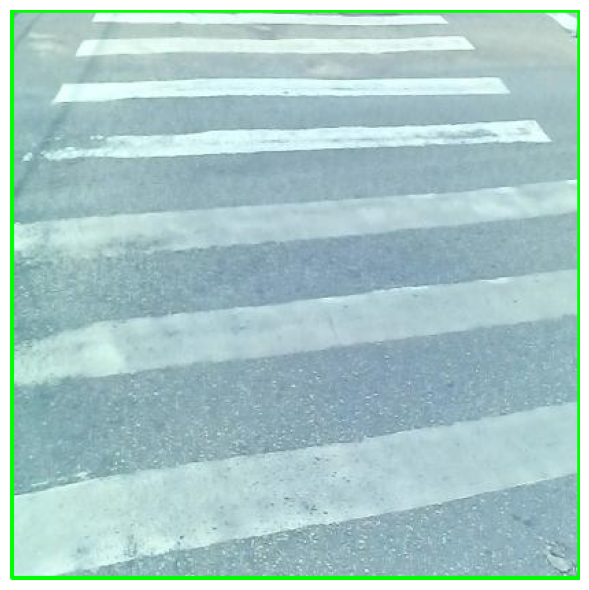

🟡 Testando imagem: i1045.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1045.jpg: 640x640 1 Crosswalk, 30.5ms
Speed: 3.0ms preprocess, 30.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


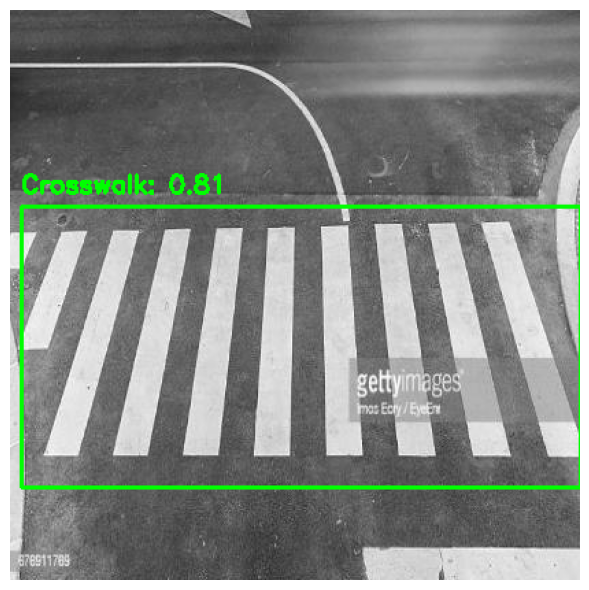

🟡 Testando imagem: i1051.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1051.jpg: 640x640 1 Crosswalk Signal, 2 Crosswalks, 26.8ms
Speed: 2.7ms preprocess, 26.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


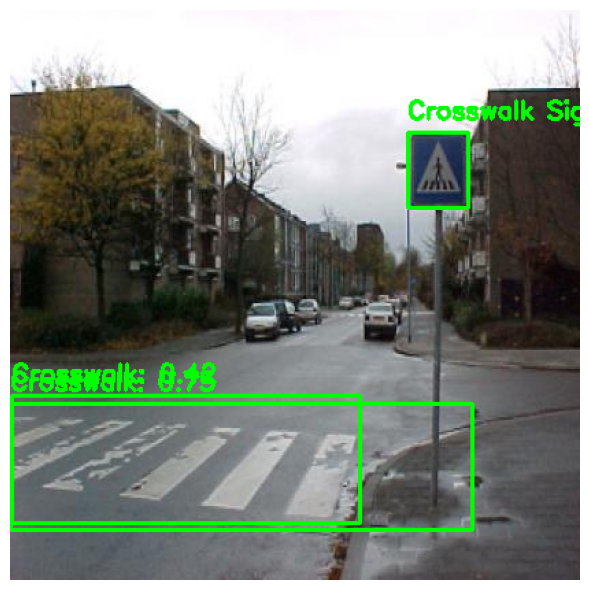

🟡 Testando imagem: i1055.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1055.jpg: 640x640 1 Crosswalk, 26.8ms
Speed: 2.5ms preprocess, 26.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


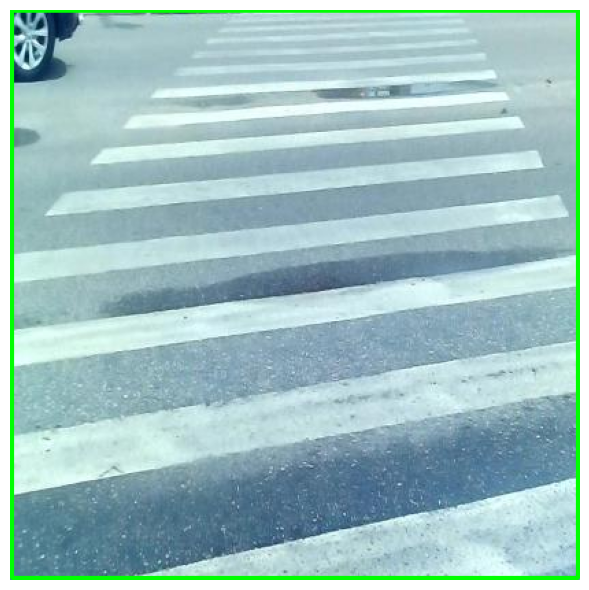

🟡 Testando imagem: i1069.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1069.jpg: 640x640 2 Crosswalks, 26.8ms
Speed: 2.7ms preprocess, 26.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


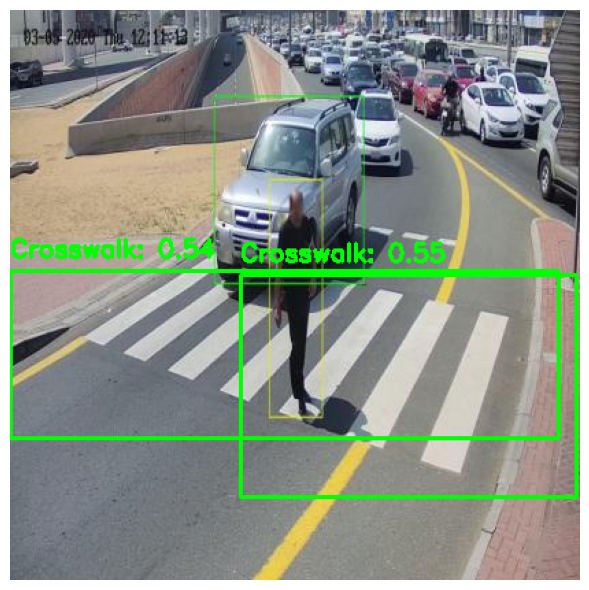

🟡 Testando imagem: i1270.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1270.jpg: 384x640 4 Pedestrians, 17.6ms
Speed: 1.1ms preprocess, 17.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


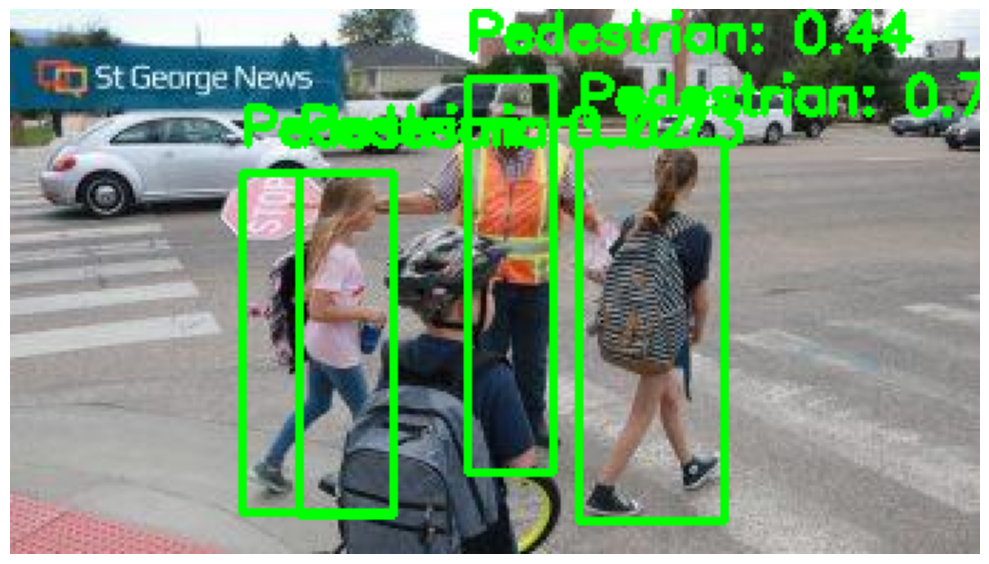

🟡 Testando imagem: i1271.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1271.jpg: 448x640 1 Pedestrian, 20.3ms
Speed: 1.4ms preprocess, 20.3ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)


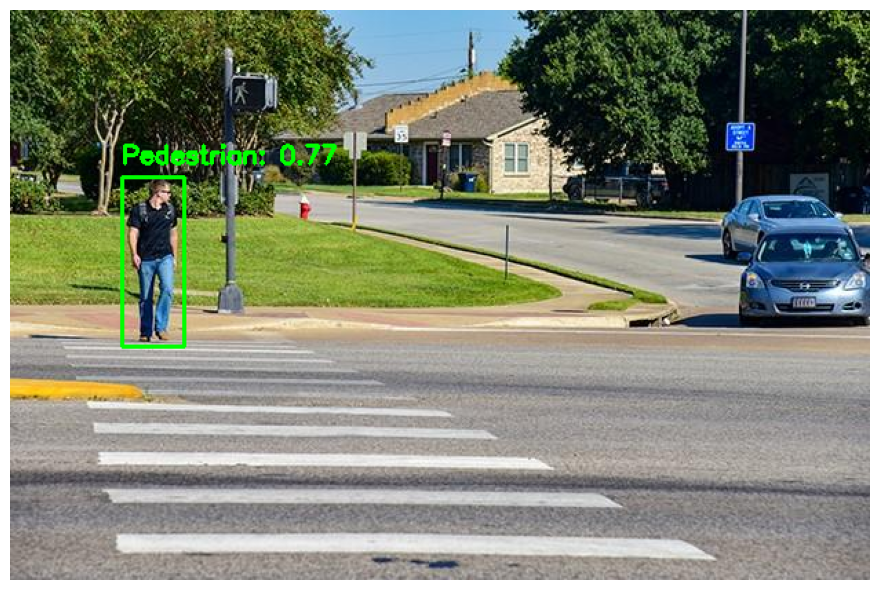

🟡 Testando imagem: i1272.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1272.jpg: 288x640 2 Pedestrians, 18.1ms
Speed: 1.2ms preprocess, 18.1ms inference, 2.0ms postprocess per image at shape (1, 3, 288, 640)


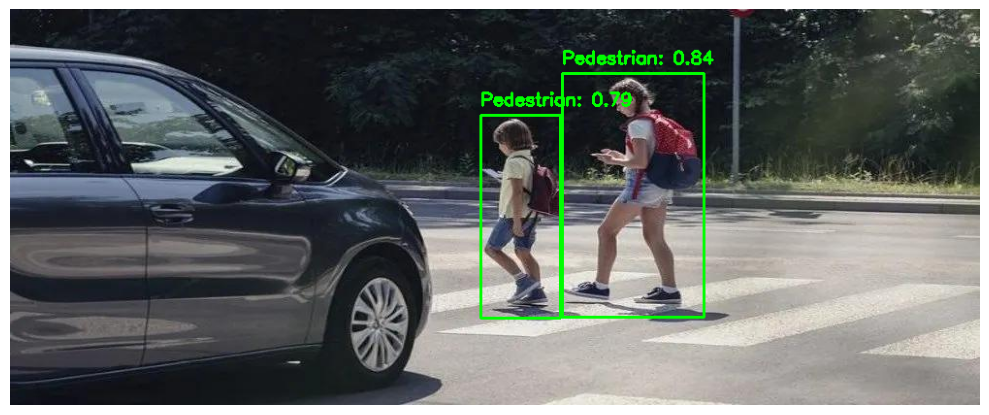

🟡 Testando imagem: i1273.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1273.jpg: 480x640 6 Pedestrians, 21.3ms
Speed: 1.8ms preprocess, 21.3ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)


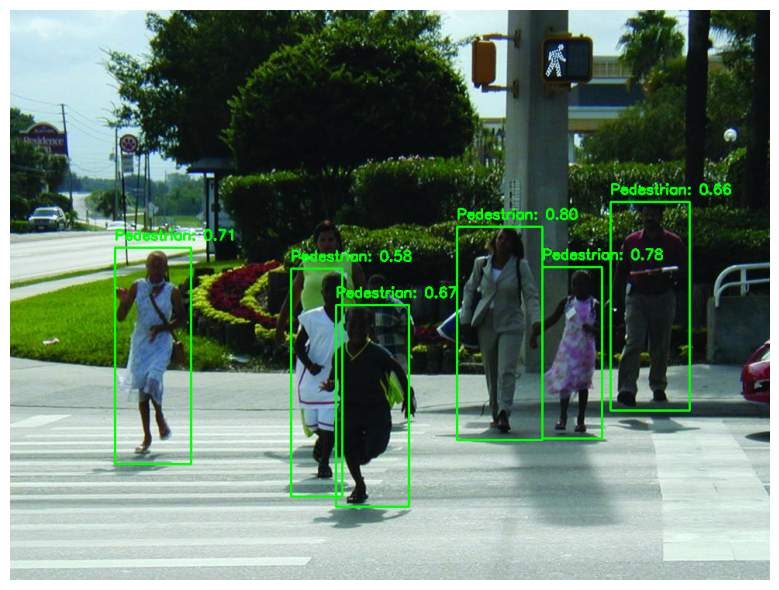

🟡 Testando imagem: i1274.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1274.jpg: 448x640 4 Pedestrians, 20.2ms
Speed: 1.3ms preprocess, 20.2ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)


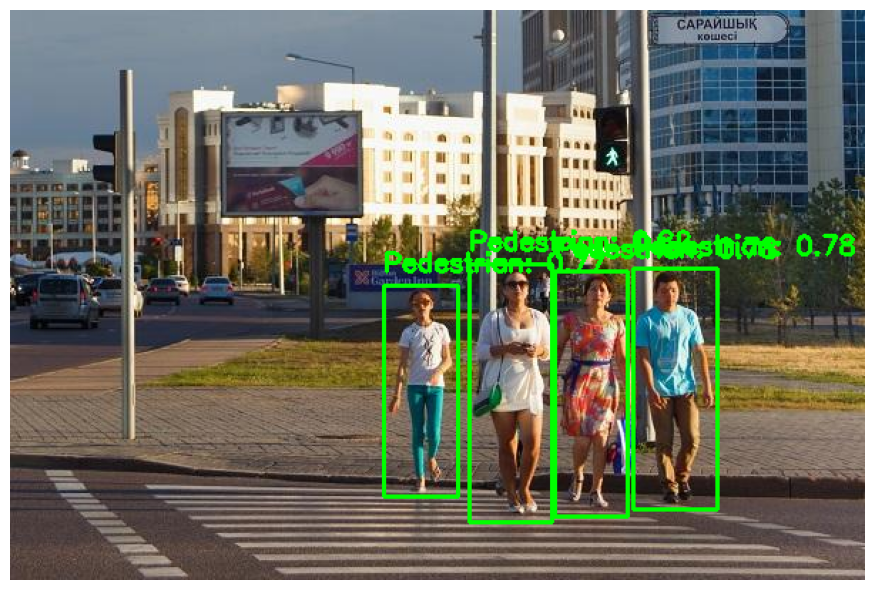

✅ Teste finalizado!


In [7]:
import os
import cv2
import torch
from PIL import Image
import matplotlib.pyplot as plt
from ultralytics import YOLO

# ✅ Para Jupyter Notebook
%matplotlib inline

# ✅ Modelo e classes
model_path = "runs_first_yolo/detect/yolo11m_finetuned/weights/best.pt"
val_img_dir = r"C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images"

class_names = [
    "Trafic Light Signal", "Stop Signal", "Speedlimit Signal", "Crosswalk Signal",
    "Crosswalk", "Pedestrian", "Bus", "Car", "Truck"
]

model = YOLO(model_path)

# 🔍 Testar uma imagem
def test_image(image_path, model, class_names, confidence_threshold=0.6):
    results = model(image_path, conf=confidence_threshold)[0]
    image_cv = cv2.imread(image_path)

    for box, score, label in zip(results.boxes.xyxy, results.boxes.conf, results.boxes.cls):
        if score < confidence_threshold:
            continue
        x_min, y_min, x_max, y_max = map(int, box.tolist())
        label_idx = int(label)
        label_text = f"{class_names[label_idx]}: {score:.2f}"

        cv2.rectangle(image_cv, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
        cv2.putText(image_cv, label_text, (x_min, y_min - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

    # Mostra a imagem com detecções
    plt.figure(figsize=(10, 6))
    plt.imshow(cv2.cvtColor(image_cv, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.tight_layout()
    plt.show(block=True)  # Força exibição mesmo fora do Jupyter

# 🚀 Testar várias imagens
print("🖼️ Testando imagens...")
valid_images = sorted([
    f for f in os.listdir(val_img_dir)
    if f.lower().endswith(('.png', '.jpg', '.jpeg'))
])

for img_name in valid_images[:10]:  # Altere para mais ou menos imagens
    img_path = os.path.join(val_img_dir, img_name)
    print(f"🟡 Testando imagem: {img_name}")
    test_image(img_path, model, class_names, confidence_threshold=0.4)

print("✅ Teste finalizado!")


🖼️ Testando imagens...
🟡 Testando imagem: i1041.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1041.jpg: 640x640 1 Crosswalk, 30.2ms
Speed: 2.4ms preprocess, 30.2ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


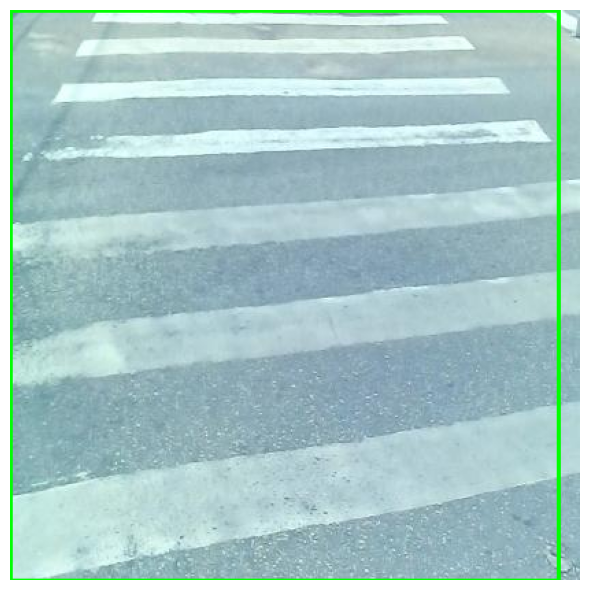

🟡 Testando imagem: i1045.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1045.jpg: 640x640 2 Crosswalks, 30.4ms
Speed: 2.6ms preprocess, 30.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


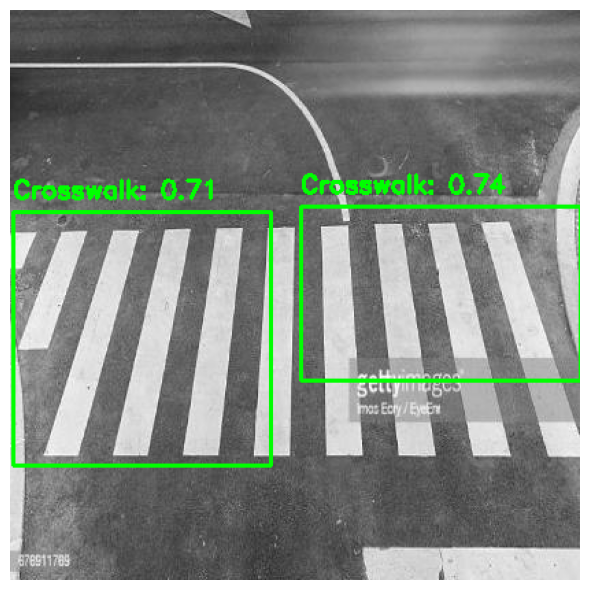

🟡 Testando imagem: i1051.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1051.jpg: 640x640 1 Crosswalk Signal, 1 Crosswalk, 30.5ms
Speed: 2.7ms preprocess, 30.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


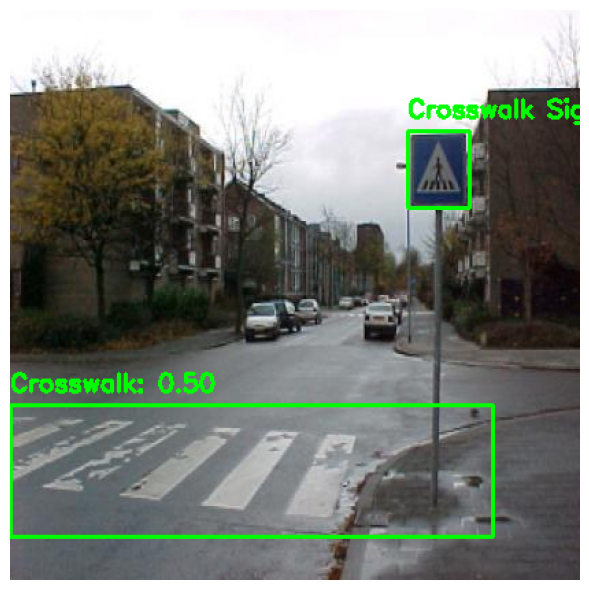

🟡 Testando imagem: i1055.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1055.jpg: 640x640 1 Crosswalk, 30.6ms
Speed: 3.1ms preprocess, 30.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


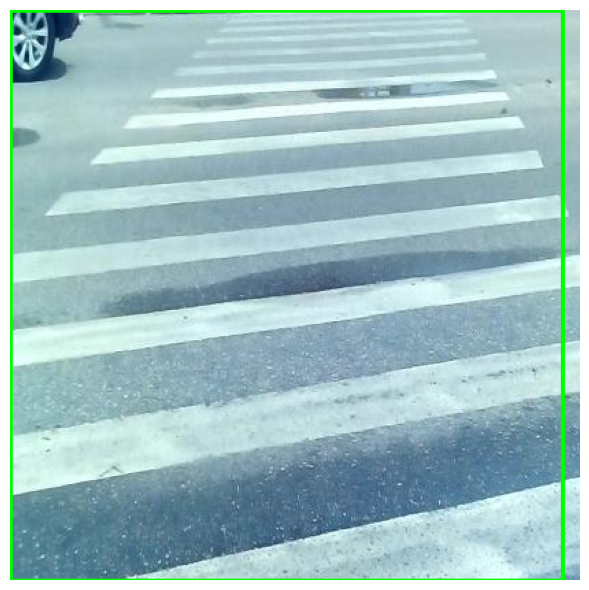

🟡 Testando imagem: i1069.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1069.jpg: 640x640 1 Crosswalk, 30.5ms
Speed: 2.6ms preprocess, 30.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


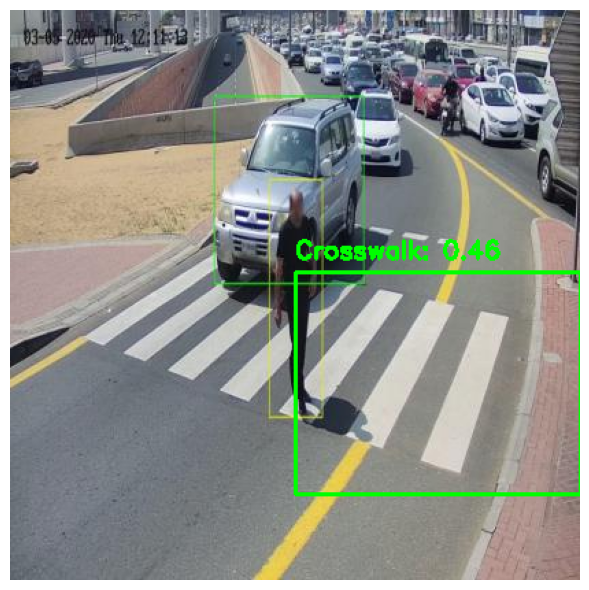

🟡 Testando imagem: i1270.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1270.jpg: 384x640 3 Pedestrians, 20.0ms
Speed: 1.3ms preprocess, 20.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


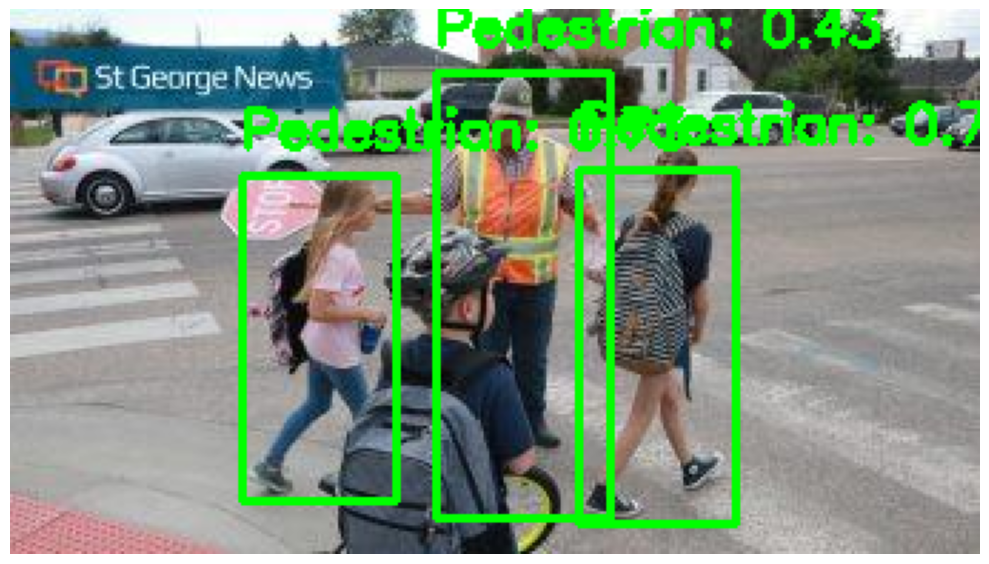

🟡 Testando imagem: i1271.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1271.jpg: 448x640 1 Pedestrian, 22.9ms
Speed: 1.3ms preprocess, 22.9ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)


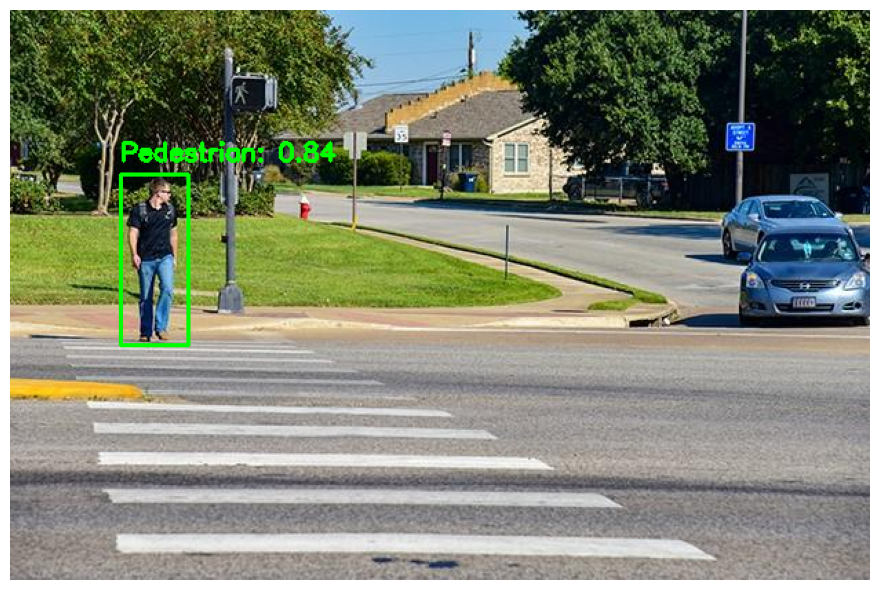

🟡 Testando imagem: i1272.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1272.jpg: 288x640 2 Pedestrians, 17.8ms
Speed: 1.0ms preprocess, 17.8ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 640)


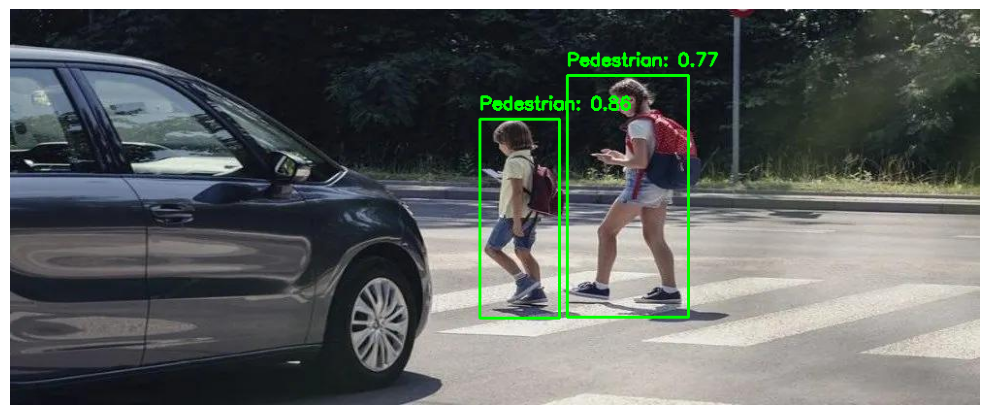

🟡 Testando imagem: i1273.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1273.jpg: 480x640 5 Pedestrians, 24.3ms
Speed: 1.7ms preprocess, 24.3ms inference, 5.6ms postprocess per image at shape (1, 3, 480, 640)


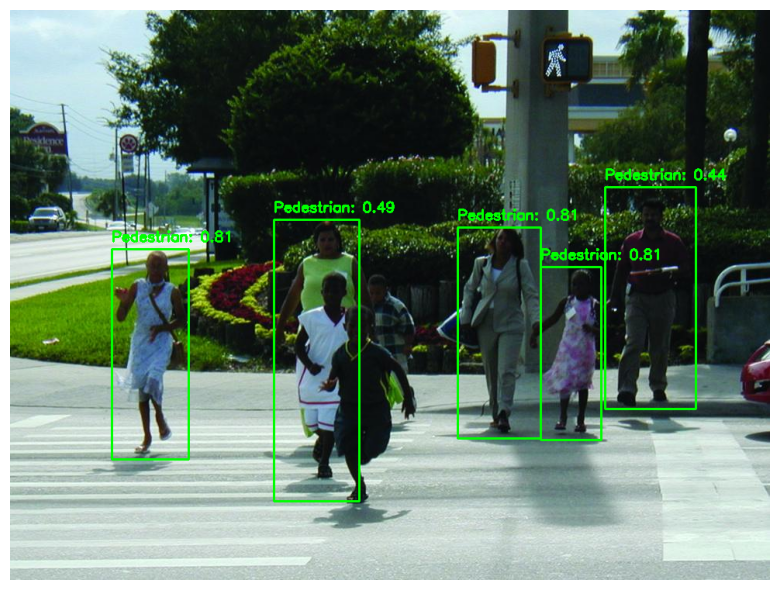

🟡 Testando imagem: i1274.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1274.jpg: 448x640 1 Trafic Light Signal, 5 Pedestrians, 23.0ms
Speed: 1.4ms preprocess, 23.0ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)


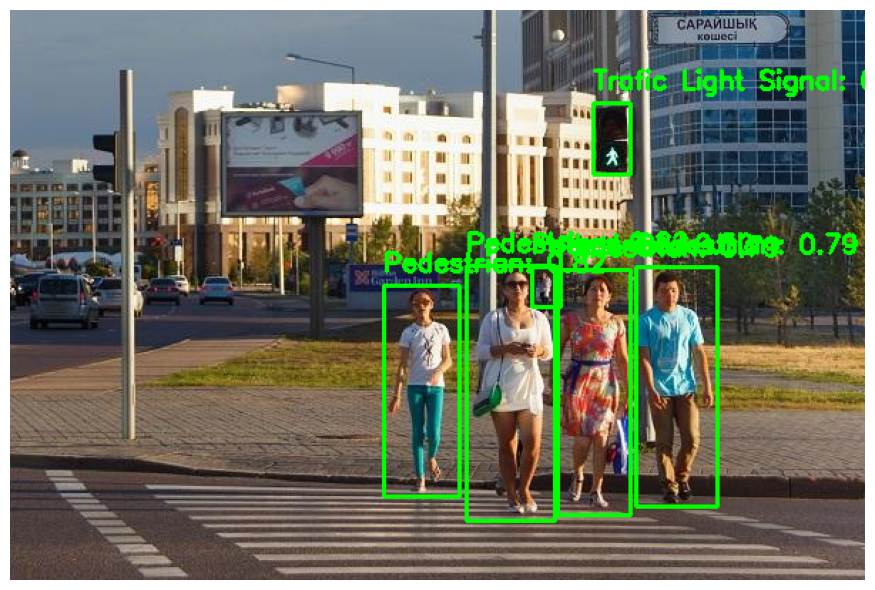

✅ Teste finalizado!


In [11]:
import os
import cv2
import torch
from PIL import Image
import matplotlib.pyplot as plt
from ultralytics import YOLO

# ✅ Para Jupyter Notebook
%matplotlib inline

# ✅ Modelo e classes
model_path = r"/AAU2/DetectObjects_JC/runs_second_yolo\yolo11m_finetuned\weights\best.pt"
val_img_dir = r"C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images"

class_names = [
    "Trafic Light Signal", "Stop Signal", "Speedlimit Signal", "Crosswalk Signal",
    "Crosswalk", "Pedestrian", "Bus", "Car", "Truck"
]

model = YOLO(model_path)

# 🔍 Testar uma imagem
def test_image(image_path, model, class_names, confidence_threshold=0.6):
    results = model(image_path, conf=confidence_threshold)[0]
    image_cv = cv2.imread(image_path)

    for box, score, label in zip(results.boxes.xyxy, results.boxes.conf, results.boxes.cls):
        if score < confidence_threshold:
            continue
        x_min, y_min, x_max, y_max = map(int, box.tolist())
        label_idx = int(label)
        label_text = f"{class_names[label_idx]}: {score:.2f}"

        cv2.rectangle(image_cv, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
        cv2.putText(image_cv, label_text, (x_min, y_min - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

    # Mostra a imagem com detecções
    plt.figure(figsize=(10, 6))
    plt.imshow(cv2.cvtColor(image_cv, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.tight_layout()
    plt.show(block=True)  # Força exibição mesmo fora do Jupyter

# 🚀 Testar várias imagens
print("🖼️ Testando imagens...")
valid_images = sorted([
    f for f in os.listdir(val_img_dir)
    if f.lower().endswith(('.png', '.jpg', '.jpeg'))
])

for img_name in valid_images[:10]:  # Altere para mais ou menos imagens
    img_path = os.path.join(val_img_dir, img_name)
    print(f"🟡 Testando imagem: {img_name}")
    test_image(img_path, model, class_names, confidence_threshold=0.4)

print("✅ Teste finalizado!")


🖼️ Testando imagens...
🟡 Testando imagem: i1041.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1041.jpg: 640x640 1 Crosswalk, 30.4ms
Speed: 2.2ms preprocess, 30.4ms inference, 5.7ms postprocess per image at shape (1, 3, 640, 640)


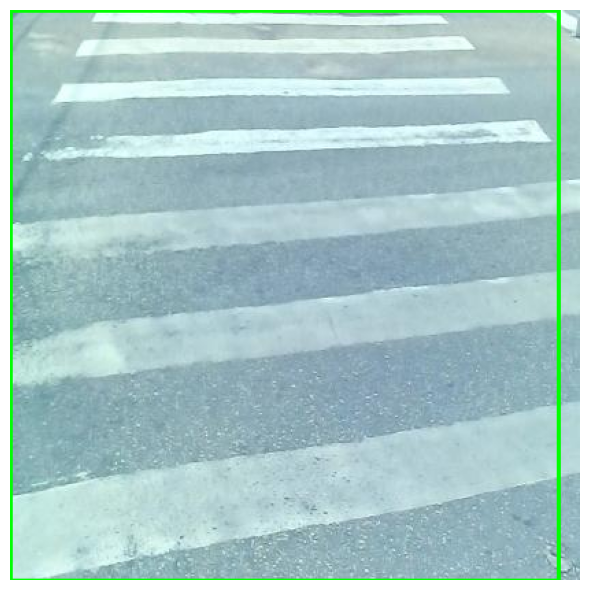

🟡 Testando imagem: i1045.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1045.jpg: 640x640 2 Crosswalks, 30.4ms
Speed: 2.6ms preprocess, 30.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


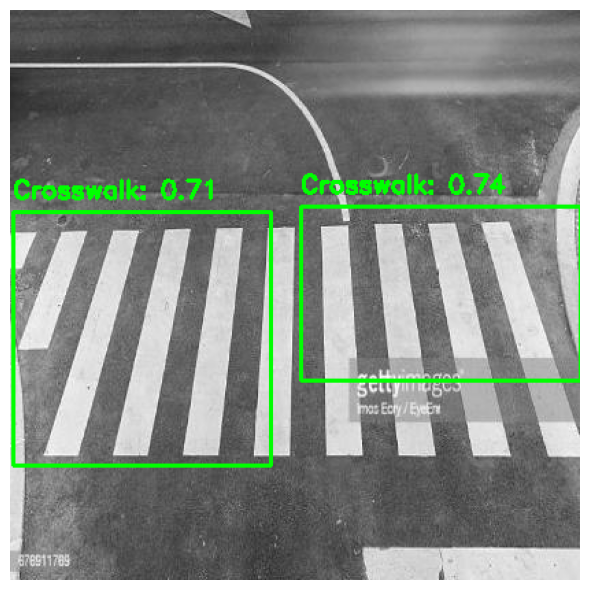

🟡 Testando imagem: i1051.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1051.jpg: 640x640 1 Crosswalk Signal, 1 Crosswalk, 28.6ms
Speed: 2.7ms preprocess, 28.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


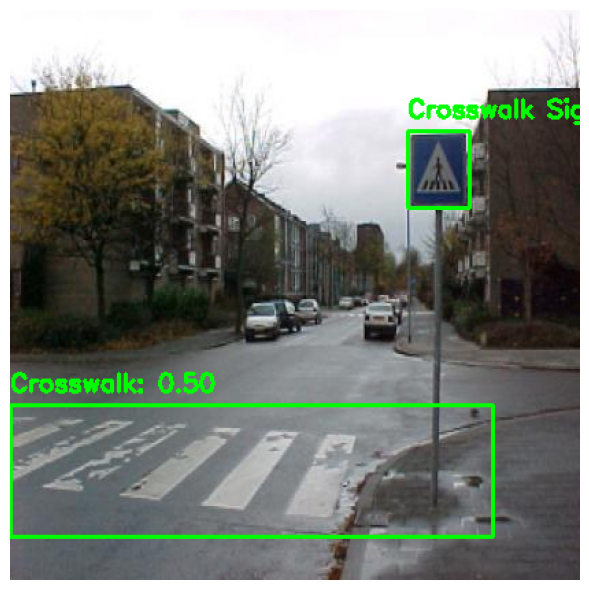

🟡 Testando imagem: i1055.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1055.jpg: 640x640 1 Crosswalk, 28.4ms
Speed: 3.0ms preprocess, 28.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


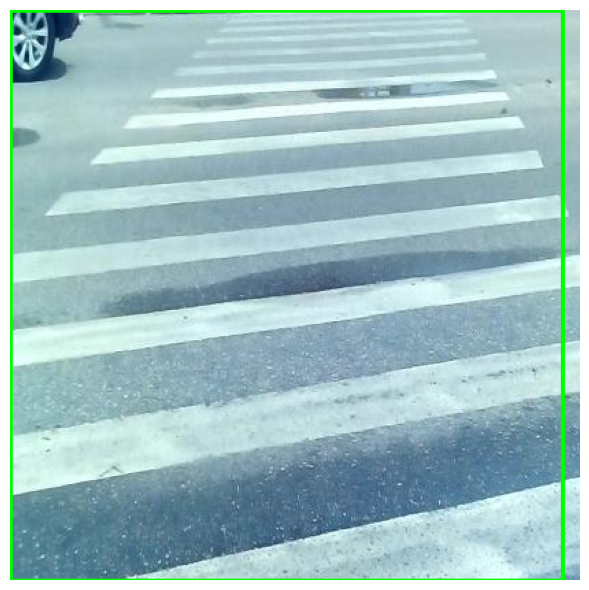

🟡 Testando imagem: i1069.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1069.jpg: 640x640 1 Crosswalk, 28.4ms
Speed: 2.7ms preprocess, 28.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


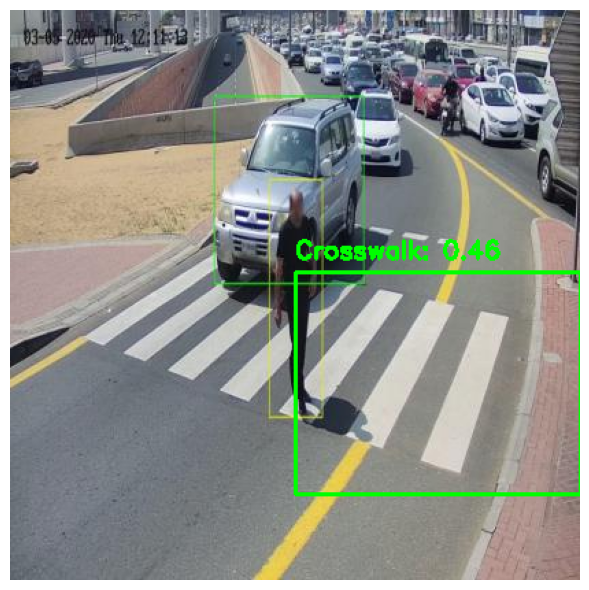

🟡 Testando imagem: i1270.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1270.jpg: 384x640 3 Pedestrians, 19.4ms
Speed: 1.2ms preprocess, 19.4ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)


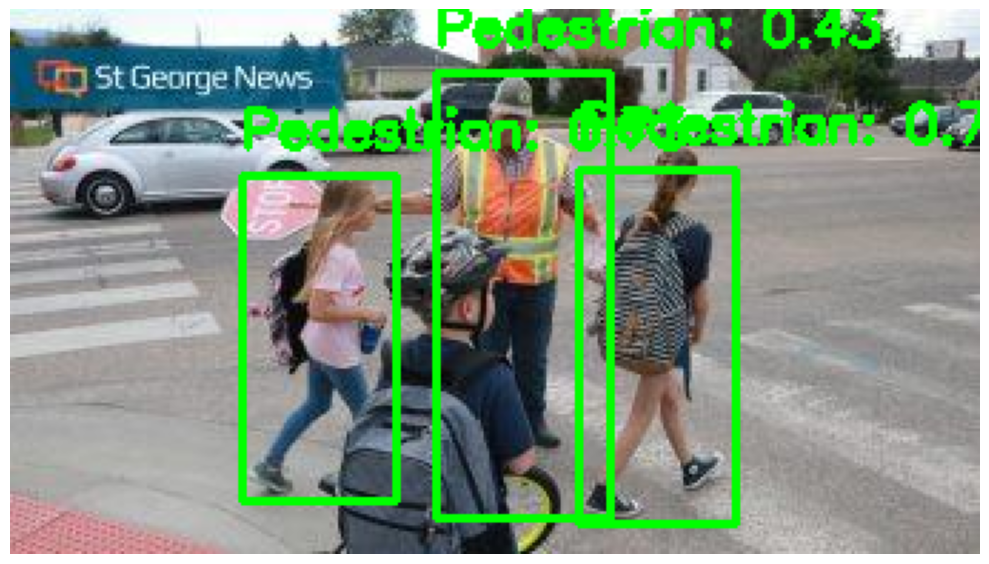

🟡 Testando imagem: i1271.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1271.jpg: 448x640 1 Pedestrian, 22.1ms
Speed: 1.5ms preprocess, 22.1ms inference, 2.2ms postprocess per image at shape (1, 3, 448, 640)


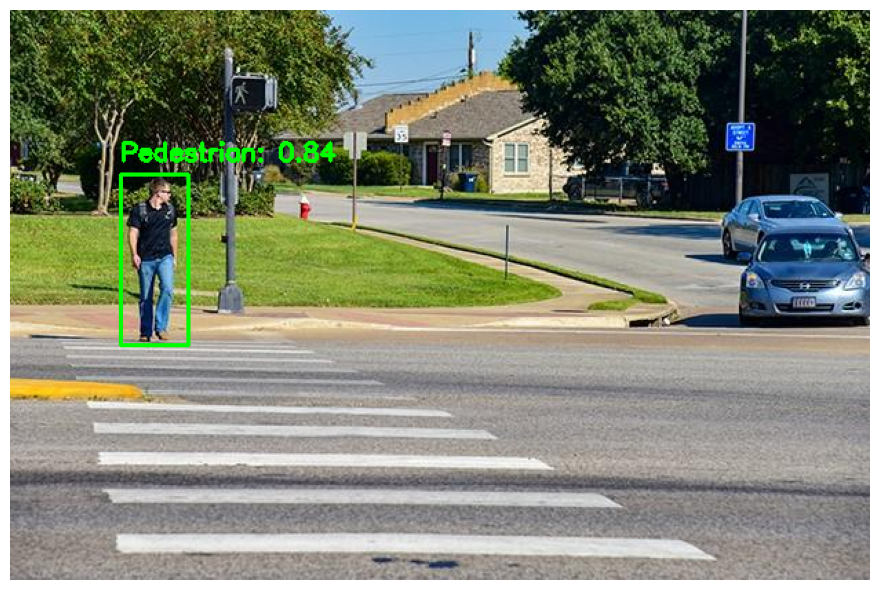

🟡 Testando imagem: i1272.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1272.jpg: 288x640 2 Pedestrians, 16.6ms
Speed: 1.3ms preprocess, 16.6ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 640)


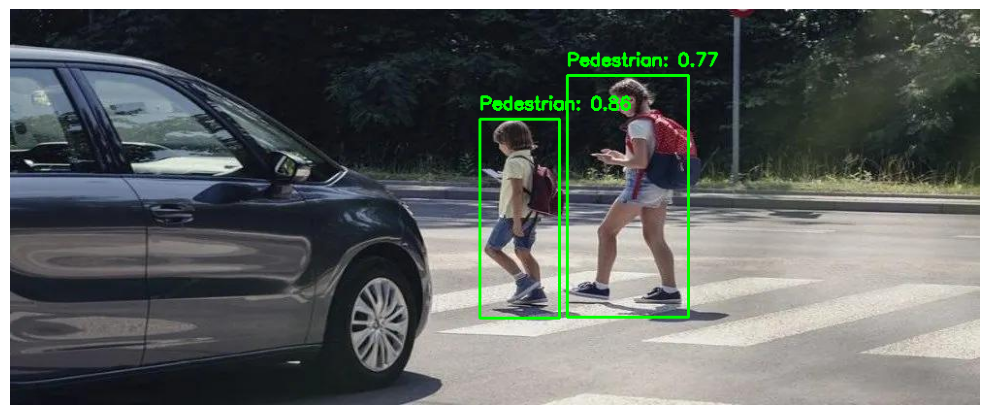

🟡 Testando imagem: i1273.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1273.jpg: 480x640 5 Pedestrians, 22.5ms
Speed: 1.6ms preprocess, 22.5ms inference, 12.3ms postprocess per image at shape (1, 3, 480, 640)


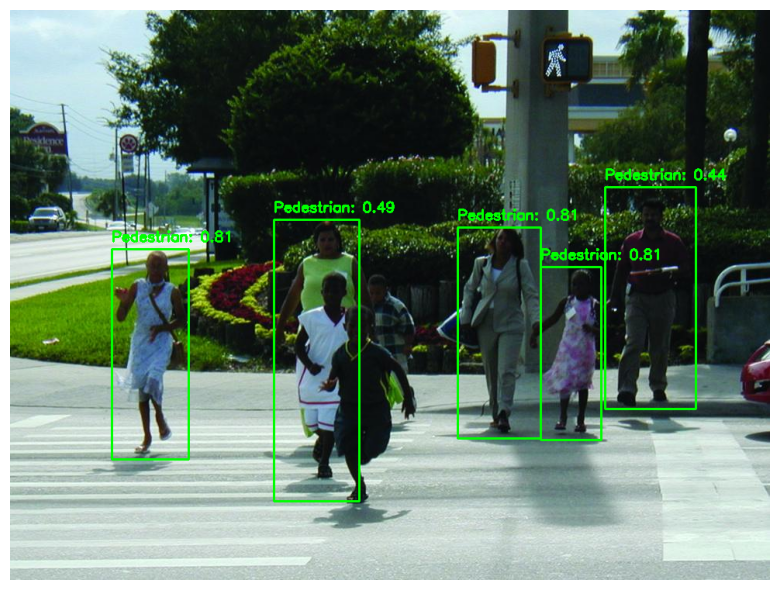

🟡 Testando imagem: i1274.jpg

image 1/1 C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images\i1274.jpg: 448x640 1 Trafic Light Signal, 5 Pedestrians, 21.6ms
Speed: 1.5ms preprocess, 21.6ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)


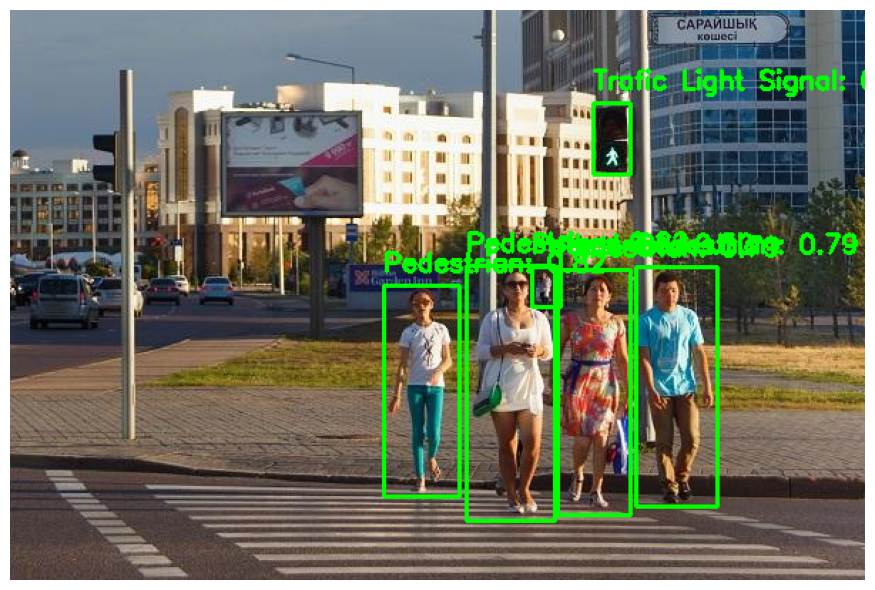

✅ Teste finalizado!


In [12]:
import os
import cv2
import torch
from PIL import Image
import matplotlib.pyplot as plt
from ultralytics import YOLO

# ✅ Para Jupyter Notebook
%matplotlib inline

# ✅ Modelo e classes
model_path = r"/AAU2/DetectObjects_JC/runs_second_yolo\yolo11m_finetuned2\weights\best.pt"
val_img_dir = r"C:\Users\Jorge Cunha\Desktop\Python\AI_Detection_Cars\AAU2\DetectObjects_JC\dataset\val\images"

class_names = [
    "Trafic Light Signal", "Stop Signal", "Speedlimit Signal", "Crosswalk Signal",
    "Crosswalk", "Pedestrian", "Bus", "Car", "Truck"
]

model = YOLO(model_path)

# 🔍 Testar uma imagem
def test_image(image_path, model, class_names, confidence_threshold=0.6):
    results = model(image_path, conf=confidence_threshold)[0]
    image_cv = cv2.imread(image_path)

    for box, score, label in zip(results.boxes.xyxy, results.boxes.conf, results.boxes.cls):
        if score < confidence_threshold:
            continue
        x_min, y_min, x_max, y_max = map(int, box.tolist())
        label_idx = int(label)
        label_text = f"{class_names[label_idx]}: {score:.2f}"

        cv2.rectangle(image_cv, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
        cv2.putText(image_cv, label_text, (x_min, y_min - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

    # Mostra a imagem com detecções
    plt.figure(figsize=(10, 6))
    plt.imshow(cv2.cvtColor(image_cv, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.tight_layout()
    plt.show(block=True)  # Força exibição mesmo fora do Jupyter

# 🚀 Testar várias imagens
print("🖼️ Testando imagens...")
valid_images = sorted([
    f for f in os.listdir(val_img_dir)
    if f.lower().endswith(('.png', '.jpg', '.jpeg'))
])

for img_name in valid_images[:10]:  # Altere para mais ou menos imagens
    img_path = os.path.join(val_img_dir, img_name)
    print(f"🟡 Testando imagem: {img_name}")
    test_image(img_path, model, class_names, confidence_threshold=0.4)

print("✅ Teste finalizado!")
